# MTL782 Assignment 1: Online Shopper Conversion Prediction

### Introduction:
- **Objective**: Predict whether a person will make a purchase based on their website activity and historical analytics.
- **Dataset**: The dataset is stored in `kaggle_train.csv` . Refer to `metadata.txt` for details about the data fields.
- **Evaluation Metric**: F1-score

### Setup  
Import all the necessary libraries and install the required dependencies.

In [2]:
%matplotlib inline 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
)
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

Load the dataset

In [3]:
path = "data/kaggle_train.csv"
df = pd.read_csv(path, na_values='?')

### Exploratory Data Analysis
First we understand the basic structure of the dataset using `.head()`, `.info()`, `.describe()`

In [4]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,1,15.0,1,157.0,36,3010.532051,0.000000,0.014620,0.0,0.0,May,2,2,3,2,Returning_Visitor,True,False
1,0,0.0,0,0.0,57,820.363636,0.035088,0.061651,0.0,0.0,June,3,2,3,13,Returning_Visitor,False,False
2,9,228.2,1,0.0,7,186.400000,0.020000,0.030000,0.0,0.0,Nov,2,2,1,20,Returning_Visitor,False,False
3,3,72.6,0,0.0,17,544.100000,0.000000,0.002000,0.0,0.0,Sep,2,2,9,2,New_Visitor,False,False
4,0,0.0,4,8.0,66,1514.836310,0.022887,0.044914,0.0,0.0,Dec,2,2,6,2,Returning_Visitor,False,False


In [5]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,11097.000000,11097.000000,11097.000000,11097.000000,11097.000000,11097.000000,11097.000000,11097.000000,11097.000000,11097.000000,11097.000000,11097.000000,11097.000000,11097.000000
mean,2.311886,81.118365,0.509777,34.867509,31.715419,1194.757649,0.021933,0.042813,5.860658,0.061278,2.120843,2.354060,3.146796,4.072182
std,3.317760,178.842997,1.277939,141.664660,44.192612,1908.767956,0.048070,0.048270,18.496266,0.198846,0.914069,1.718938,2.410359,4.036303
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,187.000000,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,8.000000,0.000000,0.000000,18.000000,601.971429,0.003030,0.025000,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,92.300000,0.000000,0.000000,38.000000,1466.088462,0.016667,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11097 entries, 0 to 11096
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           11097 non-null  int64  
 1   Administrative_Duration  11097 non-null  float64
 2   Informational            11097 non-null  int64  
 3   Informational_Duration   11097 non-null  float64
 4   ProductRelated           11097 non-null  int64  
 5   ProductRelated_Duration  11097 non-null  float64
 6   BounceRates              11097 non-null  float64
 7   ExitRates                11097 non-null  float64
 8   PageValues               11097 non-null  float64
 9   SpecialDay               11097 non-null  float64
 10  Month                    11097 non-null  object 
 11  OperatingSystems         11097 non-null  int64  
 12  Browser                  11097 non-null  int64  
 13  Region                   11097 non-null  int64  
 14  TrafficType           

Then we plot **Violin plots** for Numerical features and **Stacked Bar plots** for categorical features:

In [7]:
categorical_features = ["OperatingSystems", "Browser", "Region", "TrafficType", "VisitorType", "Weekend", "Month"]
numerical_features = ["Administrative", "Administrative_Duration", "Informational", "Informational_Duration", "ProductRelated", "ProductRelated_Duration", "BounceRates", "ExitRates", "PageValues", "SpecialDay"]

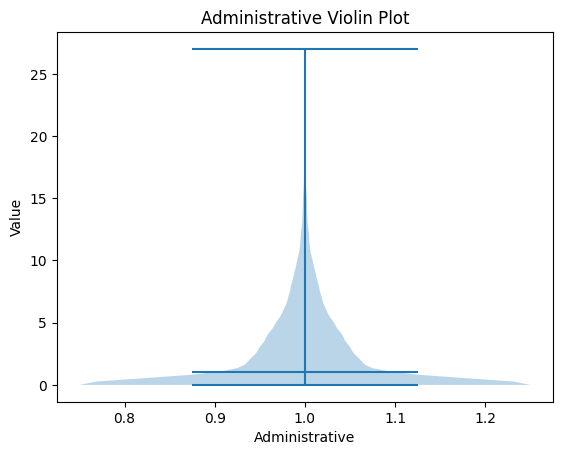

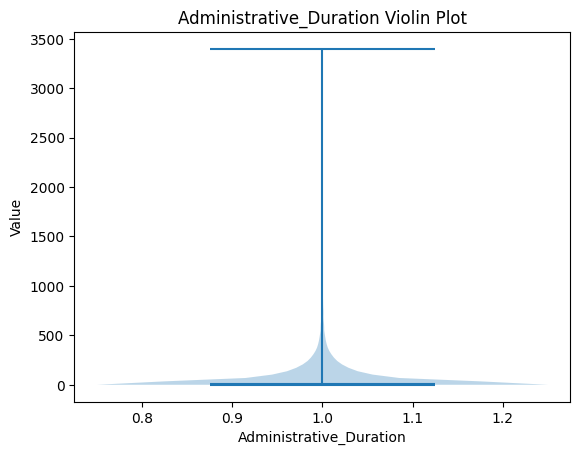

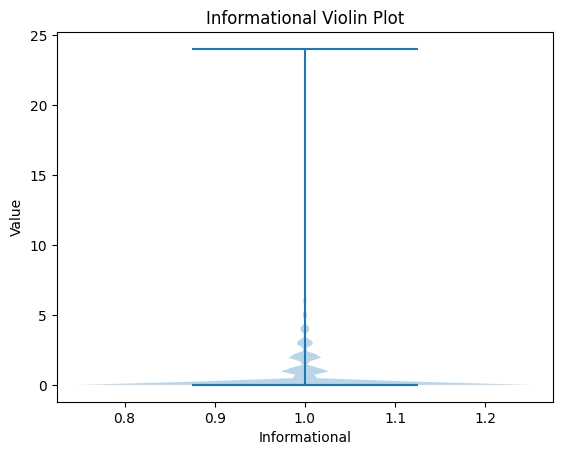

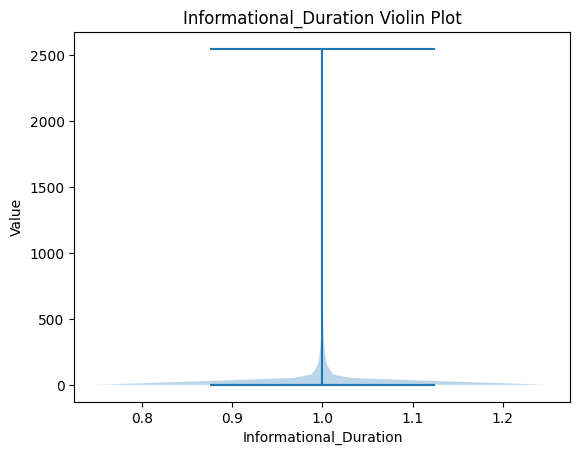

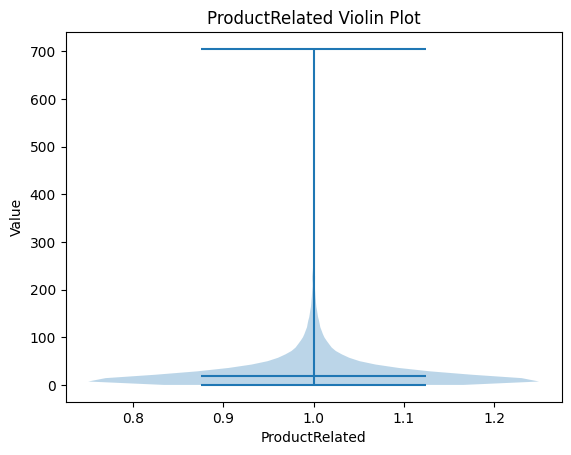

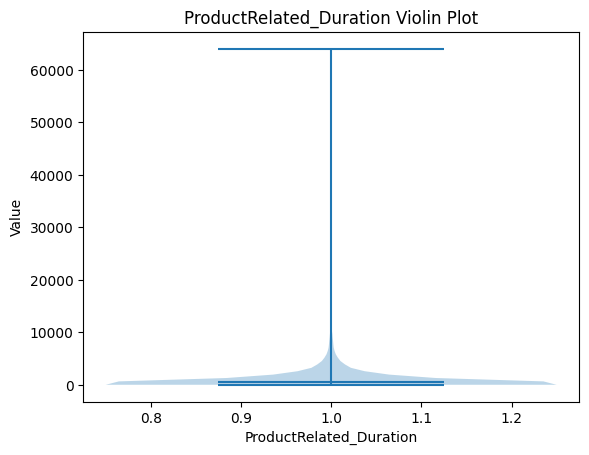

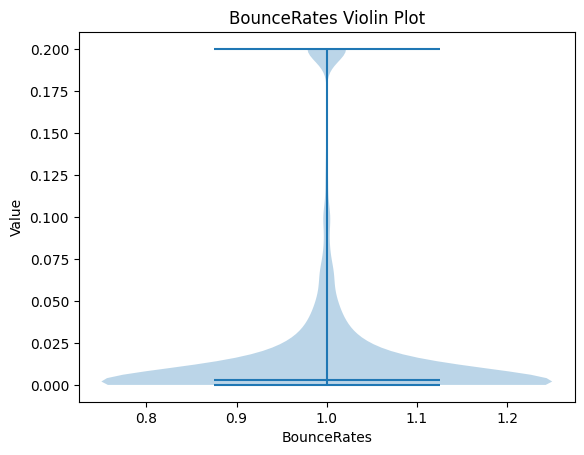

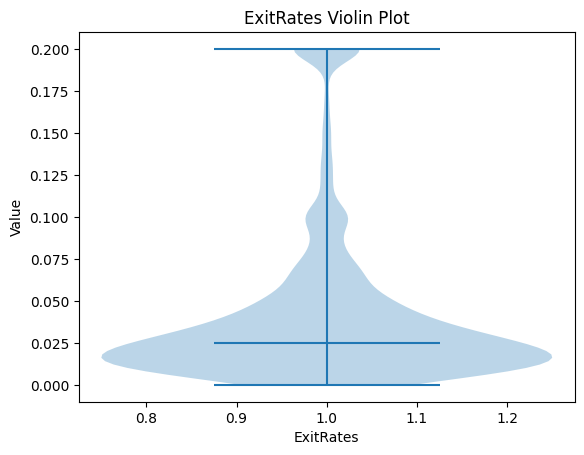

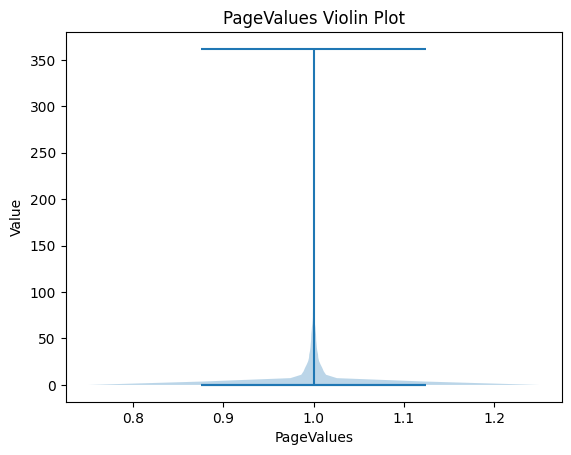

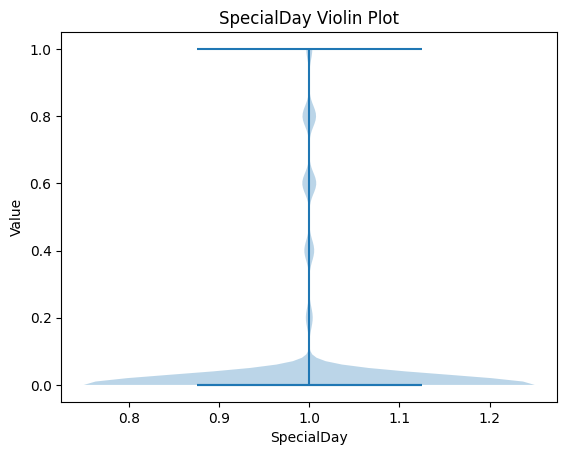

In [8]:
for feature in numerical_features:
    plt.figure()
    plt.violinplot(df[feature], showmedians=True)
    plt.xlabel(feature)
    plt.ylabel('Value')
    plt.title(feature+' Violin Plot')
    plt.show()

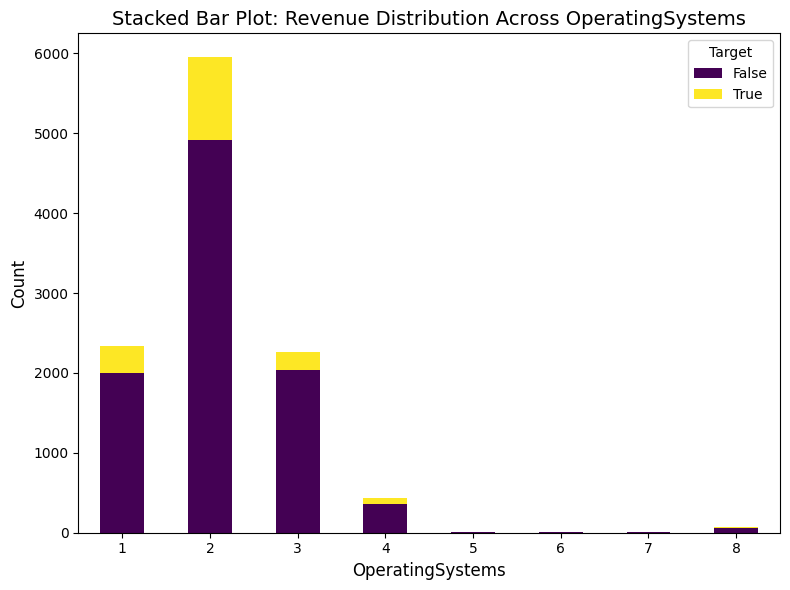

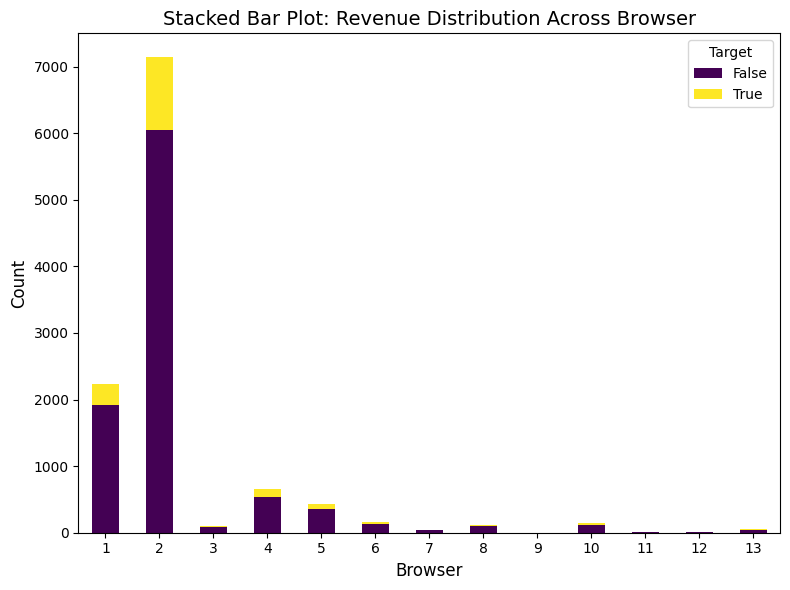

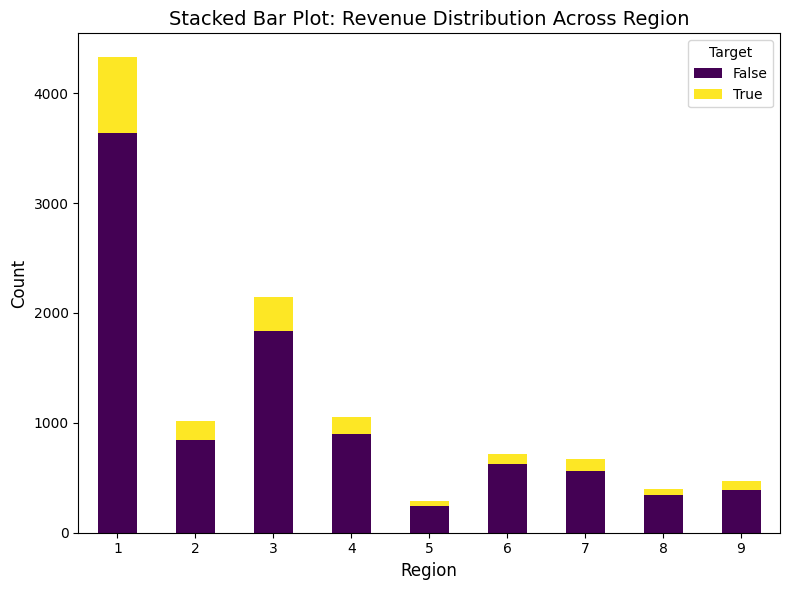

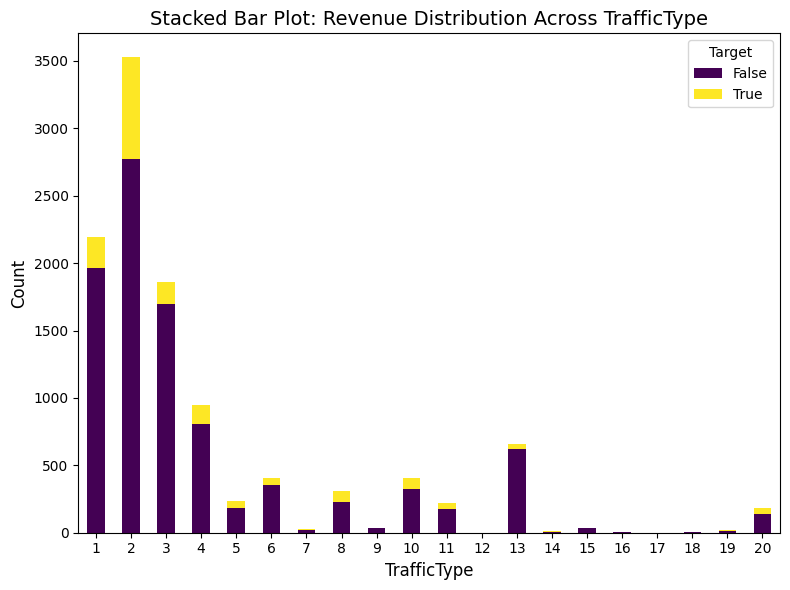

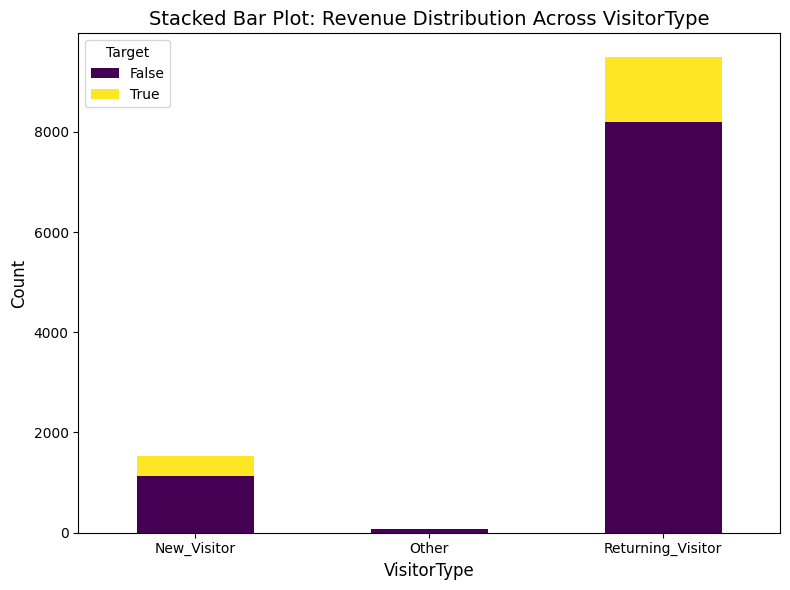

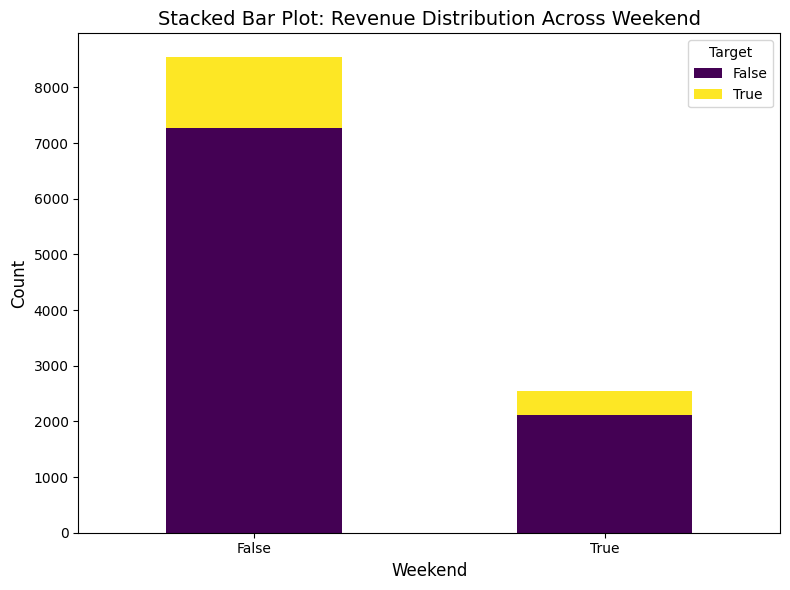

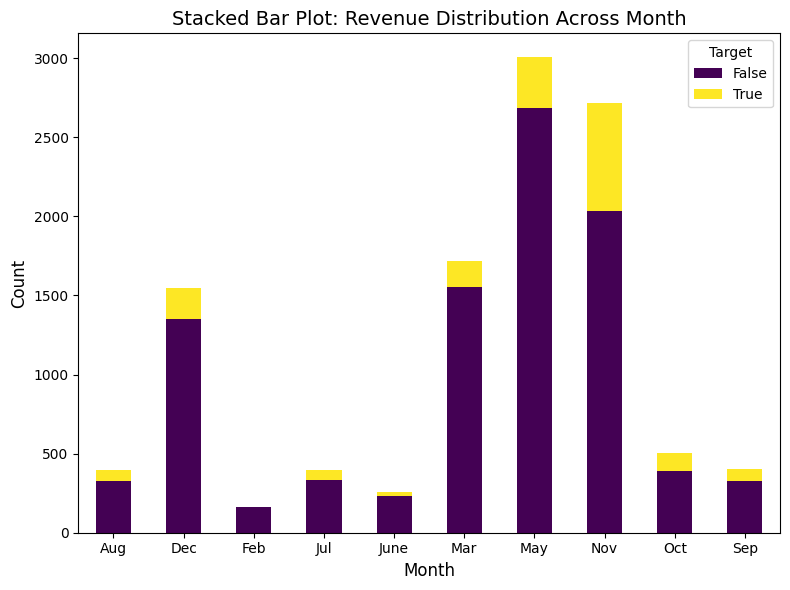

In [9]:
for feature in categorical_features:
    crosstab = pd.crosstab(df[feature], df['Revenue'])

    crosstab.plot(kind='bar', stacked=True, colormap='viridis', figsize=(8, 6))

    plt.title(f'Stacked Bar Plot: Revenue Distribution Across {feature}', fontsize=14)
    plt.xlabel(feature, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=0, fontsize=10)
    plt.legend(title='Target', fontsize=10)
    plt.tight_layout()

    plt.show()

We use `ProfileReport` from `ydata_profiling` to create a detailed report including **Histograms** for numerical variables, **Count plots** for categorical features, **Correlation heatmaps** etc.

In [10]:
profile = ProfileReport(df, title = "Online Shopper Training Data Profile")

In [13]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Data Preprocessing

Plotting **Box Plots** to better understand data distribution for each numerical feature before outlier removal :

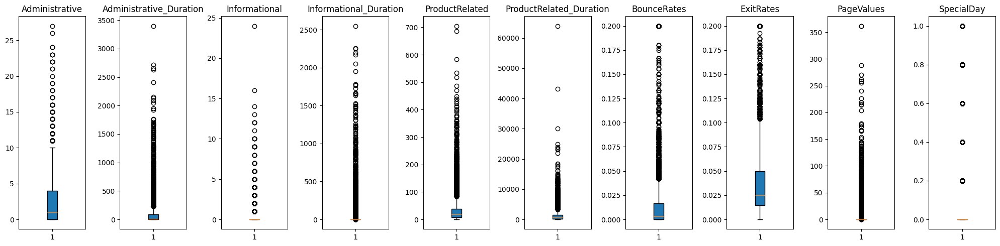

In [14]:
fig, axes = plt.subplots(1, len(numerical_features), figsize=(20, 5))
for i, feature in enumerate(numerical_features):
    axes[i].boxplot(df[feature], patch_artist=True)
    axes[i].set_title(feature)
plt.tight_layout()
plt.show()

Calculating fraction of **IQR** outliers per feature :

In [15]:
def num_outliers_iqr(df, features):
    df_clean = df.copy()
    print("Fraction of outliers in:")
    for feature in features:
        Q1 = df_clean[feature].quantile(0.25)
        Q3 = df_clean[feature].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR        
        df_clean = df_clean[(df_clean[feature] >= lower_bound) & (df_clean[feature] <= upper_bound)]
        print(feature, ":", (df.shape[0] - df_clean.shape[0])/df.shape[0])

num_outliers_iqr(df, numerical_features)

Fraction of outliers in:
Administrative : 0.032441200324412
Administrative_Duration : 0.12048301342705235
Informational : 0.27638100387492115
Informational_Duration : 0.27638100387492115
ProductRelated : 0.3270253221591421
ProductRelated_Duration : 0.3667657925565468
BounceRates : 0.4487699378210327
ExitRates : 0.45904298459042986
PageValues : 0.5419482743083717
SpecialDay : 0.5926827070379381


Removing more than 10 percent of the rows will result in too much data loss. Since only `Administrative` has less than 10 percent outliers by IQR method, we only consider this feature for outlier removal :

In [16]:
def remove_outliers_iqr(df, features):
    df_clean = df.copy()
    for feature in features:
        Q1 = df_clean[feature].quantile(0.25)
        Q3 = df_clean[feature].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR        
        df_clean = df_clean[(df_clean[feature] >= lower_bound) & (df_clean[feature] <= upper_bound)]
    return df_clean

selected_features = ["Administrative"]
df_clean = remove_outliers_iqr(df, selected_features)

Dividing the data into features and target variable:

In [17]:
def label(val):
    if (val == True):
        return 1
    return 0
y = df_clean["Revenue"]
y = y.apply(label)
X = df_clean.drop(columns = ["Revenue"])

Applying **One-Hot Encoding** for Categorical Variables and **Z-Score Normalization** for Numerical Variables:

In [18]:
OH_encoder = OneHotEncoder(drop = 'first', handle_unknown='ignore', sparse_output=False)
OH_cols = pd.DataFrame(OH_encoder.fit_transform(X[categorical_features]), columns=OH_encoder.get_feature_names_out())
OH_cols.index = X.index

In [19]:
Z_scaler = StandardScaler()
Z_scaled_cols = pd.DataFrame(Z_scaler.fit_transform(X[numerical_features]), columns = numerical_features)
Z_scaled_cols.index = X.index
X_final = pd.concat([Z_scaled_cols, OH_cols], axis = 1)

### Implementation of Logistic Regression Model

Splitting the dataset into training and testing set :

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X_final, y, test_size=0.2, random_state=1, stratify=y)

Smart Implementation of the sigmoid function (to prevent overflow):

In [21]:
def sigmoid(z):
        mask = z > 0
        exp_z = np.zeros_like(z)
        exp_z[mask] = np.exp(-z[mask])
        exp_z[~mask] = np.exp(z[~mask])
        return np.where(z > 0, 1 / (1 + exp_z), exp_z / (1 + exp_z))

Creating the LogisticRegressor class:

In [ ]:
class LogisticRegressor:  
    def __init__(self, alpha = 0.01):
        self.alpha = alpha
        self.w = None
    
    def fit(self, X, y, w = None, learning_rate = 0.1, eps = 10e-8, maxEpoch = 100):
        X = X.to_numpy()
        y = y.to_numpy().reshape(-1, 1)
        ones = np.ones((X.shape[0], 1))
        X = np.hstack((ones, X))  

        if (w == None):
            w = np.zeros(X.shape[1])

        w = w.reshape(-1, 1)
        epoch = 0
        last_diff = 0
        while(epoch < maxEpoch):          
            k = y - sigmoid(X @ w)
            delt = X.T @ k
            w_new = w + delt * learning_rate
            last_diff = np.linalg.norm(w_new - w)
            if (np.linalg.norm(w_new - w) < eps):
                w = w_new
                break
            w = w_new
            epoch += 1 
        print("last_diff:", last_diff)
        
        self.w = w

    def predict(self, X):
        X = X.to_numpy()
        ones = np.ones((X.shape[0], 1))
        X = np.hstack((ones, X))
        return (X @ self.w > 0).astype(float)

Defining a `report` function to aid in model analysis:

In [23]:
def report(y_train_pred, y_train_true, y_test_pred, y_test_true, model_name):
    accuracy_train = accuracy_score(y_train_pred, y_train_true)
    precision_train = precision_score(y_train_pred, y_train_true)
    recall_train = recall_score(y_train_pred, y_train_true)
    f1_train = f1_score(y_train_pred, y_train_true)

    print(f"Training Accuracy of {model_name}: {accuracy_train: .2f}")
    print(f"Training Precision of {model_name}: {precision_train: .2f}")
    print(f"Training Recall of {model_name}: {recall_train: .2f}")
    print(f"Training F1 Score of {model_name}: {f1_train: .2f}\n")

    accuracy_test = accuracy_score(y_test_pred, y_test_true)
    precision_test = precision_score(y_test_pred, y_test_true)
    recall_test = recall_score(y_test_pred, y_test_true)
    f1_test = f1_score(y_test_pred, y_test_true)

    print(f"Testing Accuracy of {model_name}: {accuracy_test: .2f}")
    print(f"Testing Precision of {model_name}: {precision_test: .2f}")
    print(f"Testing Recall of {model_name}: {recall_test: .2f}")
    print(f"Testing F1 Score of {model_name}: {f1_test: .2f}")


Creating a `LogisticRegressor` model, then training and evaluating it :

In [ ]:
OnlineShopperModel = LogisticRegressor()
OnlineShopperModel.fit(X_train, y_train, maxEpoch=7000, learning_rate=0.0001)

mypredict_train = OnlineShopperModel.predict(X_train)
mypredict_test = OnlineShopperModel.predict(X_test)

report(mypredict_train, y_train, mypredict_test, y_test, model_name="my Logistic Regressor")

last_diff: 0.00021049267143184898
Training Accuracy of my Logistic Regressor:  0.90
Training Precision of my Logistic Regressor:  0.42
Training Recall of my Logistic Regressor:  0.78
Training F1 Score of my Logistic Regressor:  0.54

Testing Accuracy of my Logistic Regressor:  0.89
Testing Precision of my Logistic Regressor:  0.41
Testing Recall of my Logistic Regressor:  0.72
Testing F1 Score of my Logistic Regressor:  0.52


Creating a `LogisticRegression` model from `sklearn`, then training and evaluating it :

In [25]:
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

skLogpredict_train = model.predict(X_train)
skLogpredict_test = model.predict(X_test)

report(skLogpredict_train, y_train, skLogpredict_test, y_test, model_name="sklearn's Logistic Regressor")

Training Accuracy of sklearn's Logistic Regressor:  0.90
Training Precision of sklearn's Logistic Regressor:  0.42
Training Recall of sklearn's Logistic Regressor:  0.78
Training F1 Score of sklearn's Logistic Regressor:  0.54

Testing Accuracy of sklearn's Logistic Regressor:  0.89
Testing Precision of sklearn's Logistic Regressor:  0.41
Testing Recall of sklearn's Logistic Regressor:  0.73
Testing F1 Score of sklearn's Logistic Regressor:  0.52


Creating a `SVC` model from `sklearn`, then training and evaluating it :

In [26]:
model = SVC(kernel="rbf")
model.fit(X_train, y_train)

skSVCpredict_train = model.predict(X_train)
skSVCpredict_test = model.predict(X_test)

report(skSVCpredict_train, y_train, skSVCpredict_test, y_test, model_name="sklearn's SVC")

Training Accuracy of sklearn's SVC:  0.91
Training Precision of sklearn's SVC:  0.57
Training Recall of sklearn's SVC:  0.80
Training F1 Score of sklearn's SVC:  0.66

Testing Accuracy of sklearn's SVC:  0.89
Testing Precision of sklearn's SVC:  0.51
Testing Recall of sklearn's SVC:  0.68
Testing F1 Score of sklearn's SVC:  0.58


Creating a `DecisionTreeClassifier` model from `sklearn`, then training and evaluating it :

In [27]:
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

skDTpredict_train = model.predict(X_train)
skDTpredict_test = model.predict(X_test)

report(skDTpredict_train, y_train, skDTpredict_test, y_test, model_name = "sklearn's DecisionTree")

Training Accuracy of sklearn's DecisionTree:  1.00
Training Precision of sklearn's DecisionTree:  1.00
Training Recall of sklearn's DecisionTree:  1.00
Training F1 Score of sklearn's DecisionTree:  1.00

Testing Accuracy of sklearn's DecisionTree:  0.87
Testing Precision of sklearn's DecisionTree:  0.60
Testing Recall of sklearn's DecisionTree:  0.57
Testing F1 Score of sklearn's DecisionTree:  0.59


### Comparison of the models :
* Our implementation of Logistic Regression (`LogisticRegressor`) gives the same accuracy on testing data (upto 2 decimal) places as `sklearn`'s `LogisticRegression`, `SVC` and `DecisionTree`. 
* The *Precision* of `DecisionTree` is the best, better by 0.20 than our `LogisticRegressor`. 
* `sklearn`'s `LogisticRegression` gives the best *Recall*, but it is better than our model by only 0.01. 
* `DecisionTree` and `SVC` give the best *F1-score*, which is better than our model by 0.06.  

Overall, for an *Online Shopper prediction* scenario, we should select the models with the **best *Recall*** (ensuring the its other metrics are not significantly bad). This is because such a model may be used to capture as many potential purchasers as possible in the industry. In such a setting missing a user who would have converted (lost revenue) is more critical than occasional false positives (FP). It is better to target a few extra users with incentives (e.g., discounts, retargeting ads) than to miss genuine buyers.

<i>Note :  We only used the default hyperparameters in all of `sklearn`'s model for the above comparisons (Except `max_iter` in `LogiticRegression` to mitigate convergence issues)